<a href="https://colab.research.google.com/github/mystlee/2024_CSU_AI/blob/main/chapter5/GAN_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
!pip install matplotlib

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

batch_size = 128
z_dim = 100
lr = 0.0001
epochs = 50
lambda_gp = 10
image_size = 32
channels = 3

transform = transforms.Compose([transforms.Resize(28),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])

train_dataset = datasets.MNIST(root = "./data",
                               train = True,
                               transform = transform,
                               download = True)
train_loader = DataLoader(train_dataset,
                          batch_size = batch_size,
                          shuffle = True)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9.91M/9.91M [00:01<00:00, 5.09MB/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28.9k/28.9k [00:00<00:00, 133kB/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1.65M/1.65M [00:06<00:00, 246kB/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4.54k/4.54k [00:00<00:00, 5.58MB/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [13]:
class Generator(nn.Module):
    def __init__(self, z_dim):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            nn.ConvTranspose2d(z_dim, 128,
                               kernel_size = 7,
                               stride = 1,
                               padding = 0),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64,
                               kernel_size = 4,
                               stride = 2,
                               padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 1,
                               kernel_size = 4,
                               stride = 2,
                               padding = 1),
            nn.Tanh()
        )

    def forward(self, x):
        return self.gen(x)


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(1, 64,
                      kernel_size = 4,
                      stride = 2,
                      padding = 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128,
                      kernel_size = 4,
                      stride = 2,
                      padding = 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 1,
                      kernel_size = 7,
                      stride = 1,
                      padding = 0),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.disc(x).view(-1, 1)



In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
G = Generator(z_dim).to(device)
D = Discriminator().to(device)

optimizer_G = optim.Adam(G.parameters(), lr = lr, betas = (0.5, 0.999))
optimizer_D = optim.Adam(D.parameters(), lr = lr, betas = (0.5, 0.999))

def gradient_penalty(D, real, fake, device):
    batch_size = real.size(0)
    epsilon = torch.rand(batch_size, 1, 1, 1).to(device)
    interpolates = epsilon * real + (1 - epsilon) * fake
    interpolates.requires_grad_(True)
    disc_interpolates = D(interpolates)
    gradients = torch.autograd.grad(outputs = disc_interpolates,
                                    inputs = interpolates,
                                    grad_outputs = torch.ones_like(disc_interpolates),
                                    create_graph = True,
                                    retain_graph = True,
                                    only_inputs = True)[0]

    gradients = gradients.view(gradients.size(0), -1)
    return ((gradients.norm(2, dim = 1) - 1) ** 2).mean()

Epoch [1/50], Step [469/469], D Loss: 0.5133, G Loss: -0.0252


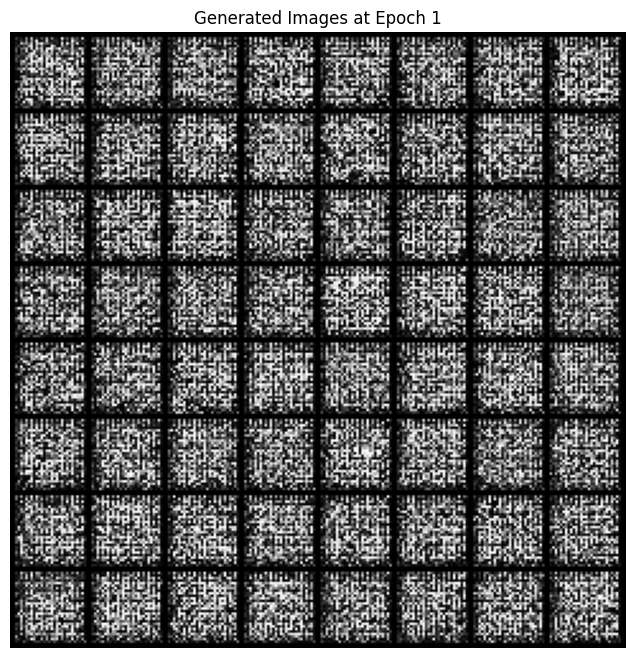

Epoch [2/50], Step [469/469], D Loss: -0.7724, G Loss: -0.0070


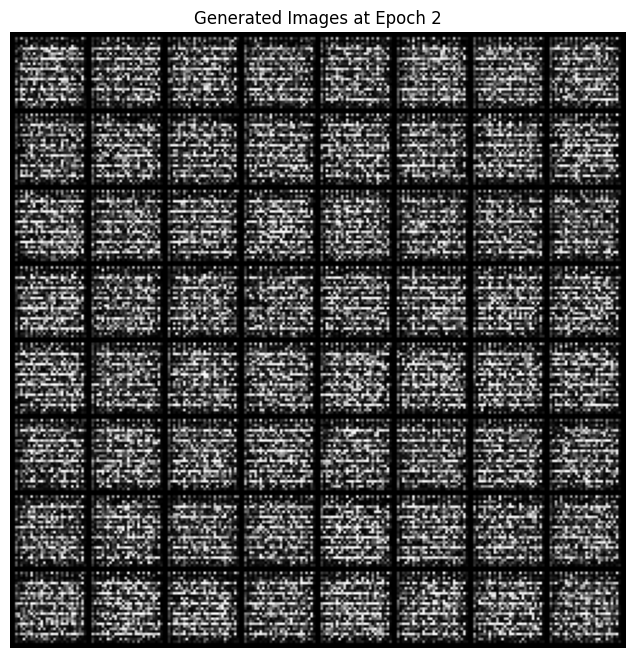

Epoch [3/50], Step [469/469], D Loss: -0.7857, G Loss: -0.0307


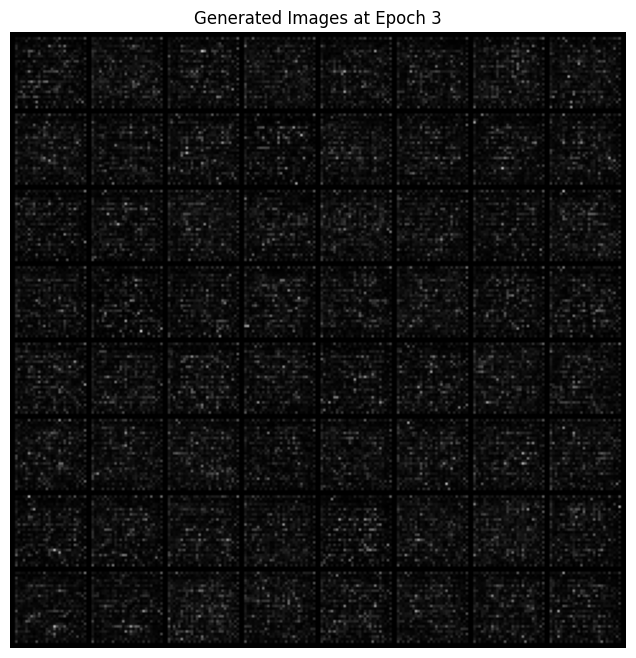

Epoch [4/50], Step [469/469], D Loss: -0.9050, G Loss: -0.0070


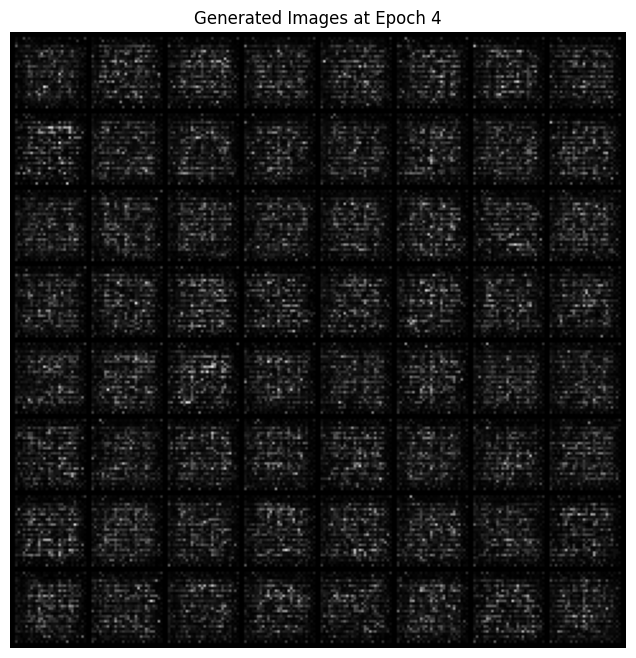

Epoch [5/50], Step [469/469], D Loss: -0.8917, G Loss: -0.0216


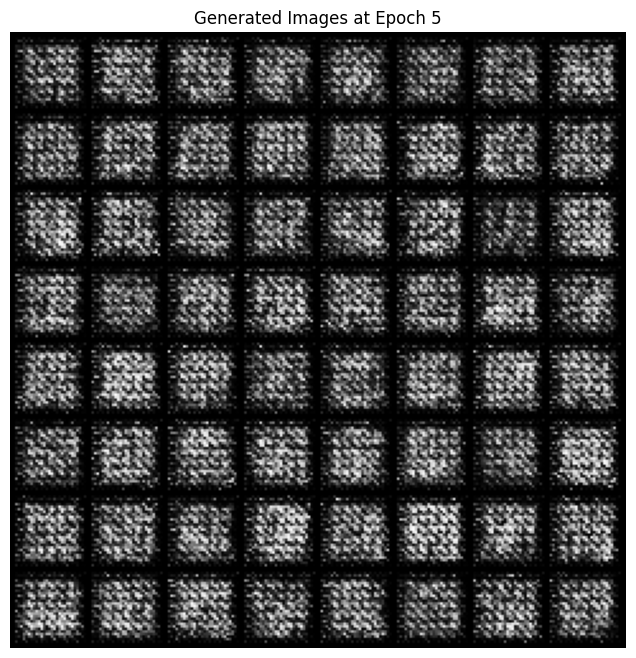

Epoch [6/50], Step [469/469], D Loss: -0.2080, G Loss: -0.4117


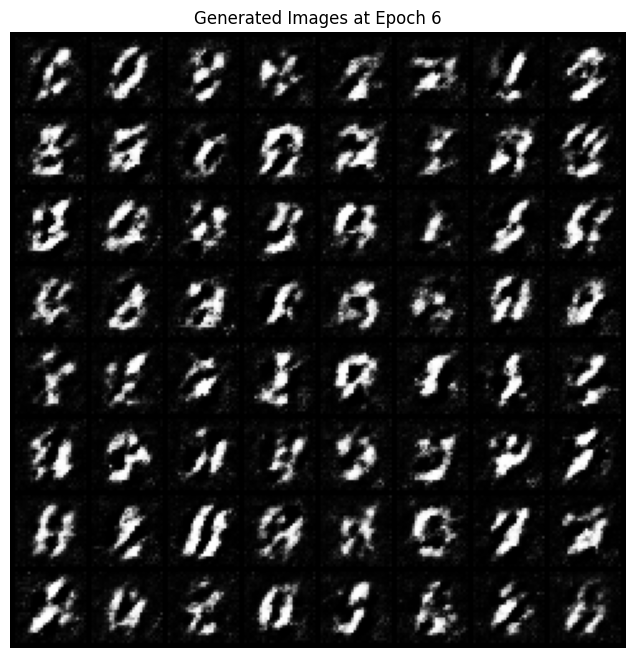

Epoch [7/50], Step [469/469], D Loss: -0.3547, G Loss: -0.4146


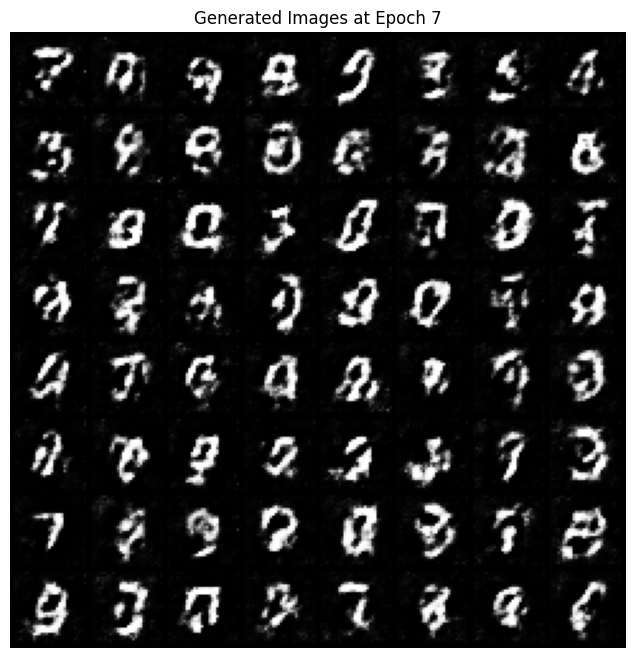

Epoch [8/50], Step [469/469], D Loss: -0.4014, G Loss: -0.3450


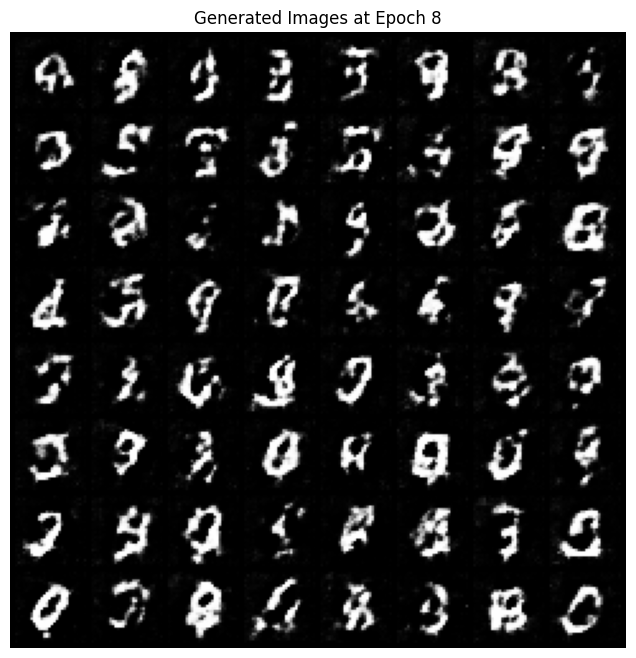

Epoch [9/50], Step [469/469], D Loss: -0.4746, G Loss: -0.2853


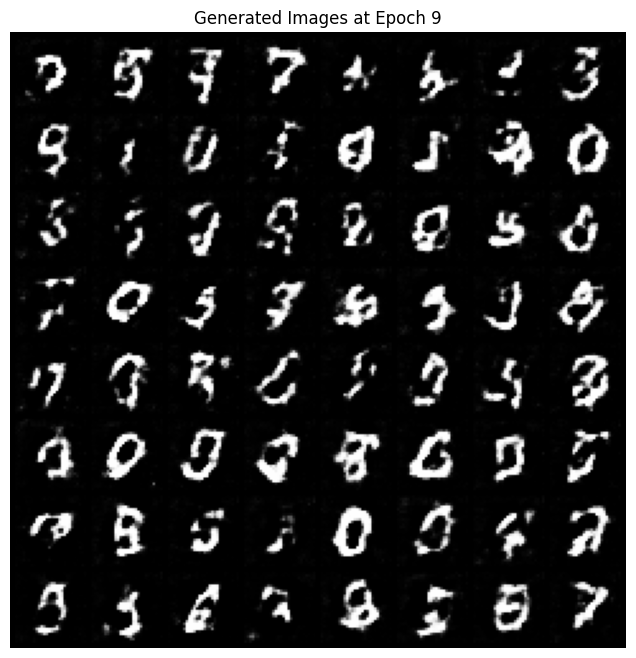

Epoch [10/50], Step [469/469], D Loss: -0.5487, G Loss: -0.2217


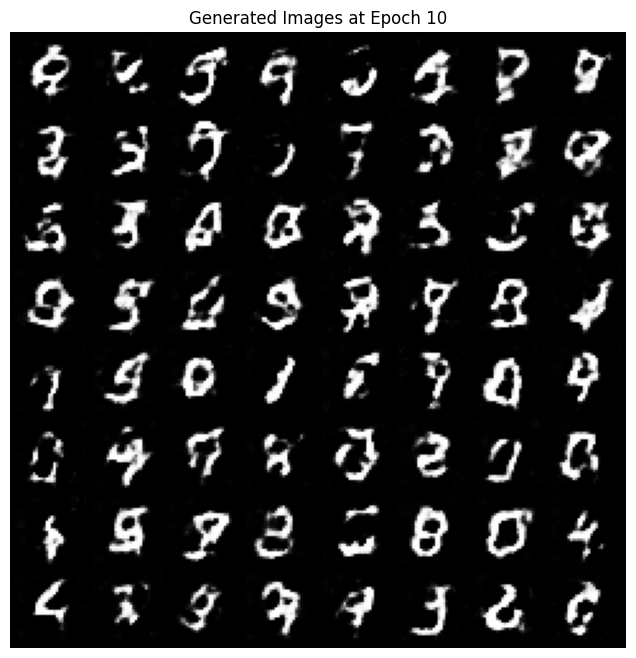

Epoch [11/50], Step [469/469], D Loss: -0.6147, G Loss: -0.2490


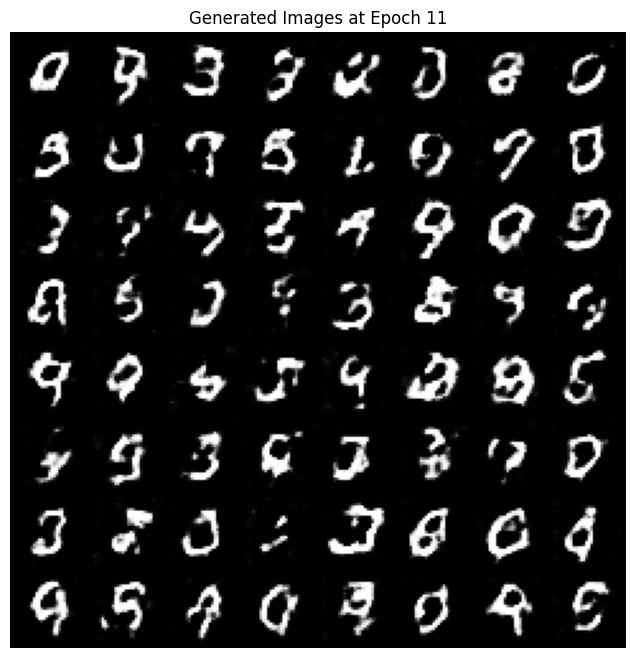

Epoch [12/50], Step [469/469], D Loss: -0.5919, G Loss: -0.1648


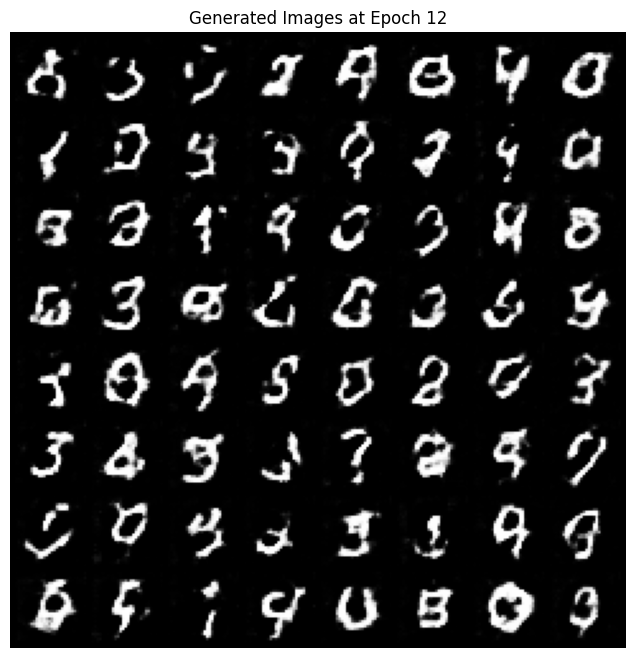

Epoch [13/50], Step [469/469], D Loss: -0.7257, G Loss: -0.1276


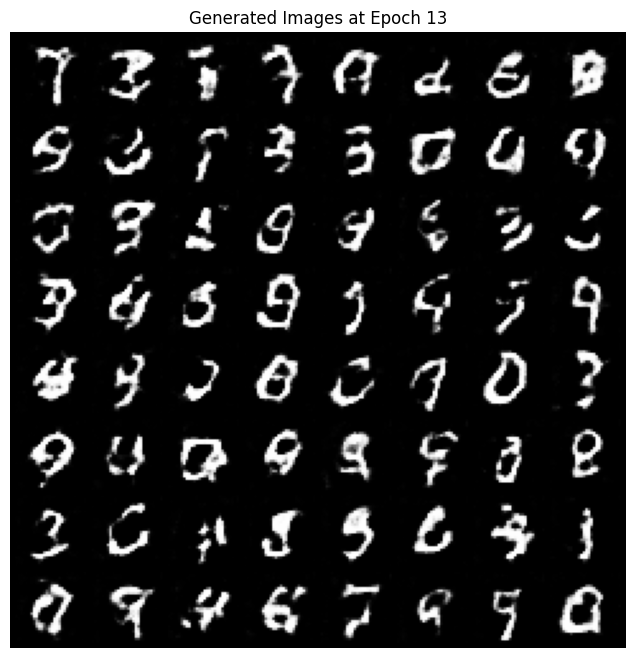

Epoch [14/50], Step [469/469], D Loss: -0.7728, G Loss: -0.1096


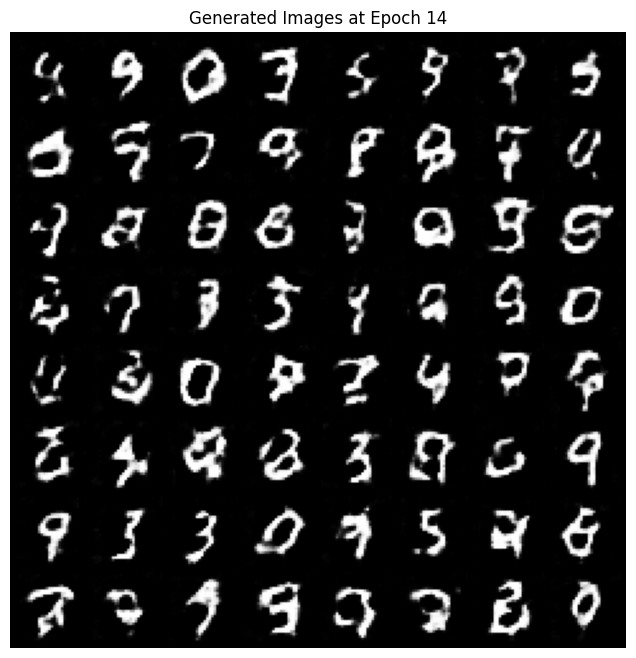

Epoch [15/50], Step [469/469], D Loss: -0.7823, G Loss: -0.1135


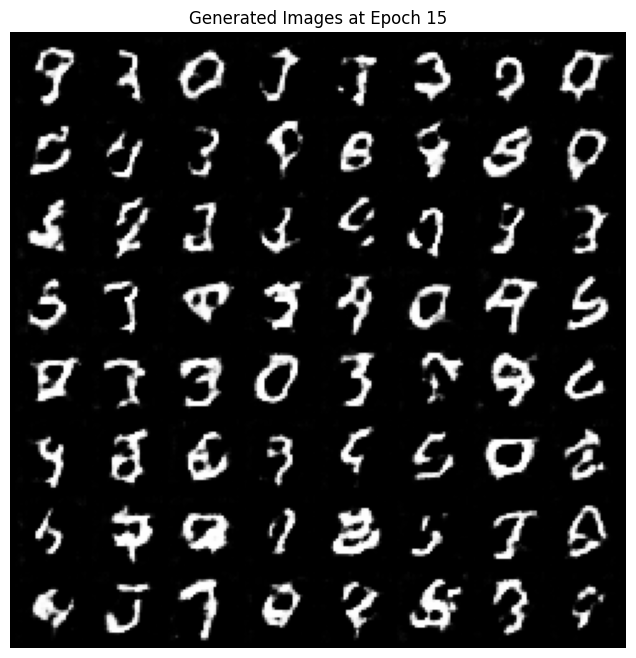

Epoch [16/50], Step [469/469], D Loss: -0.8066, G Loss: -0.0923


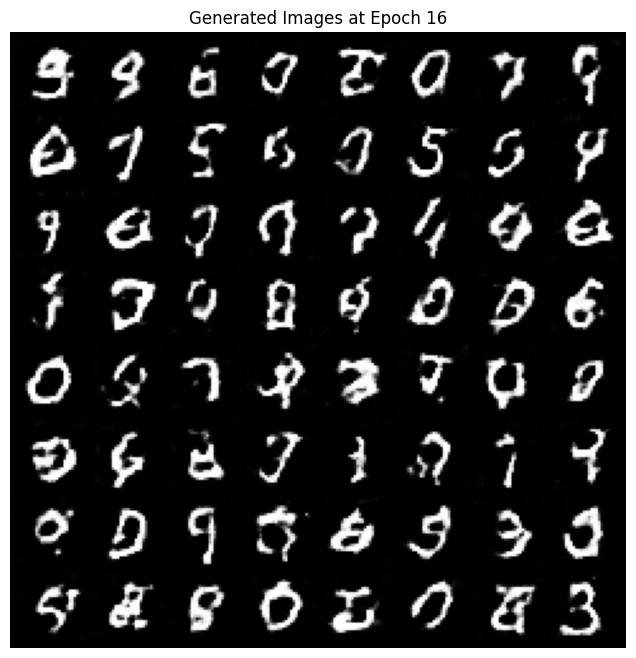

Epoch [17/50], Step [469/469], D Loss: -0.8079, G Loss: -0.0650


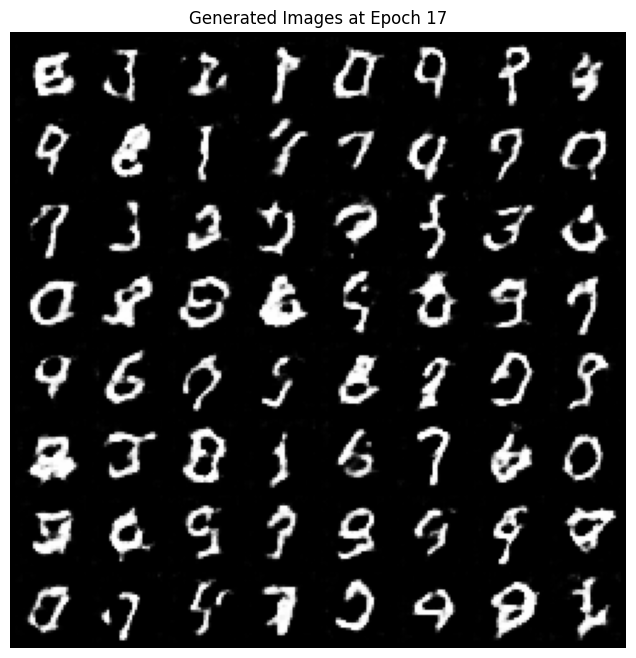

Epoch [18/50], Step [469/469], D Loss: -0.7975, G Loss: -0.0792


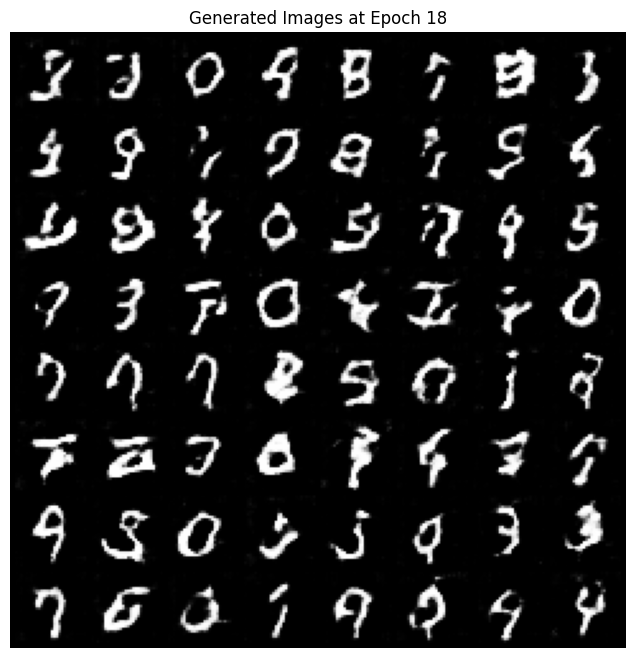

Epoch [19/50], Step [469/469], D Loss: -0.8577, G Loss: -0.0549


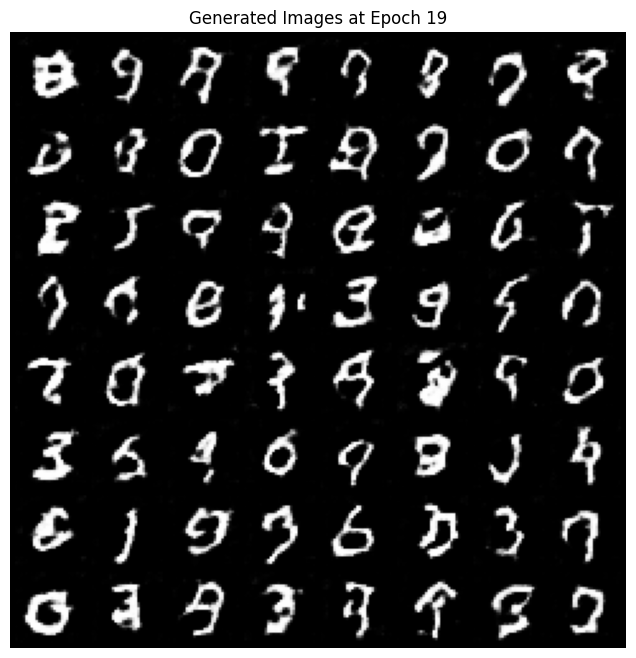

Epoch [20/50], Step [469/469], D Loss: -0.8584, G Loss: -0.0789


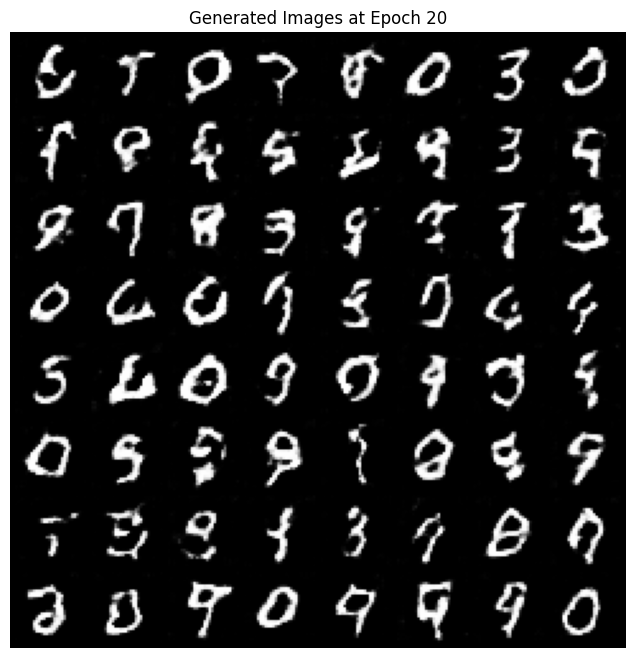

Epoch [21/50], Step [469/469], D Loss: 7.1790, G Loss: -0.4023


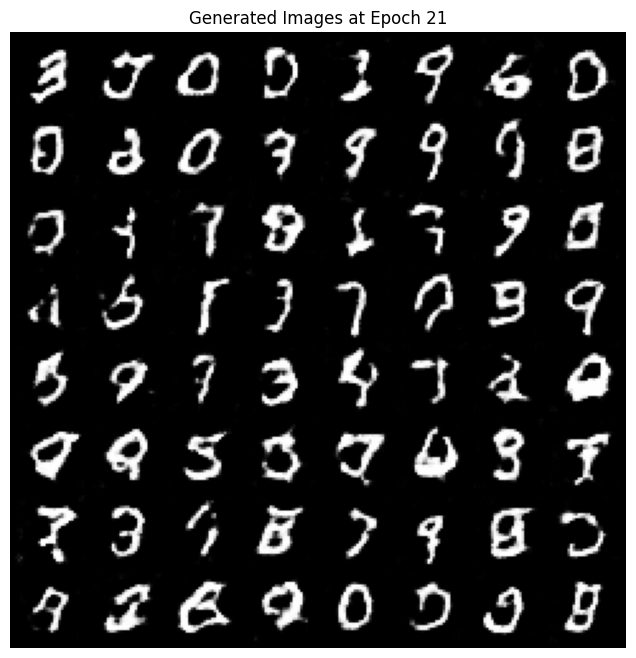

Epoch [22/50], Step [469/469], D Loss: -0.7634, G Loss: -0.0655


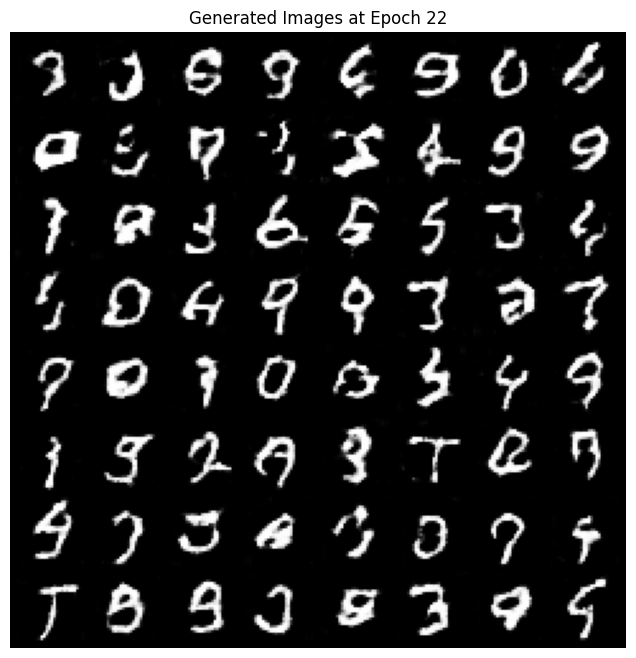

Epoch [23/50], Step [469/469], D Loss: -0.7884, G Loss: -0.0642


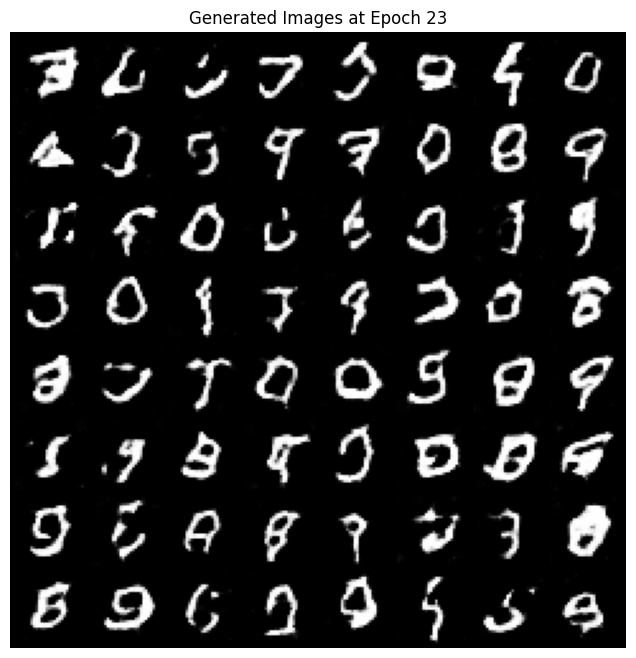

Epoch [24/50], Step [469/469], D Loss: -0.7033, G Loss: -0.1784


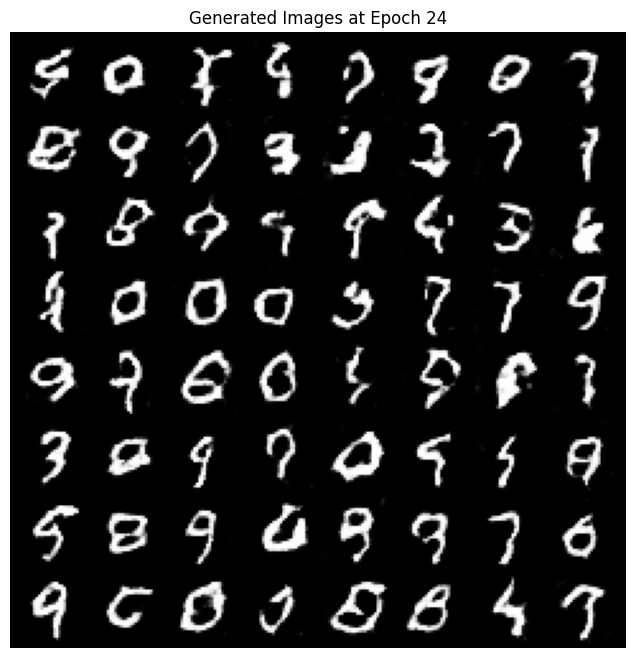

Epoch [25/50], Step [469/469], D Loss: -0.7696, G Loss: -0.0792


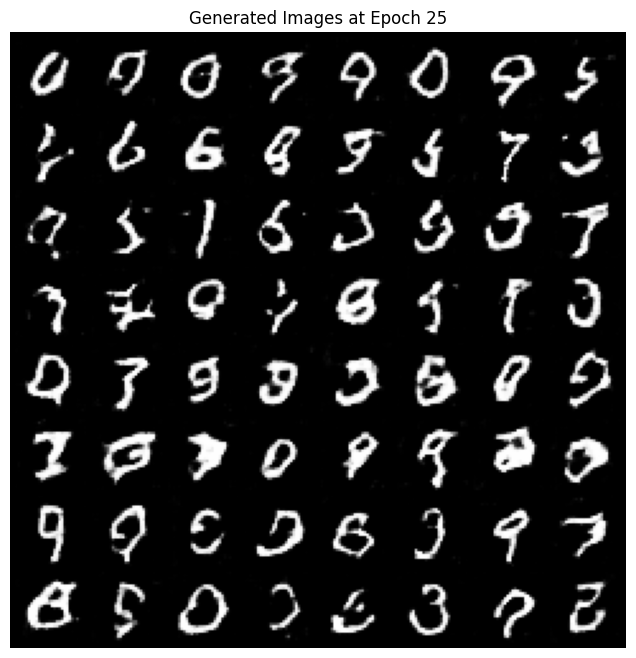

Epoch [26/50], Step [469/469], D Loss: -0.7938, G Loss: -0.0399


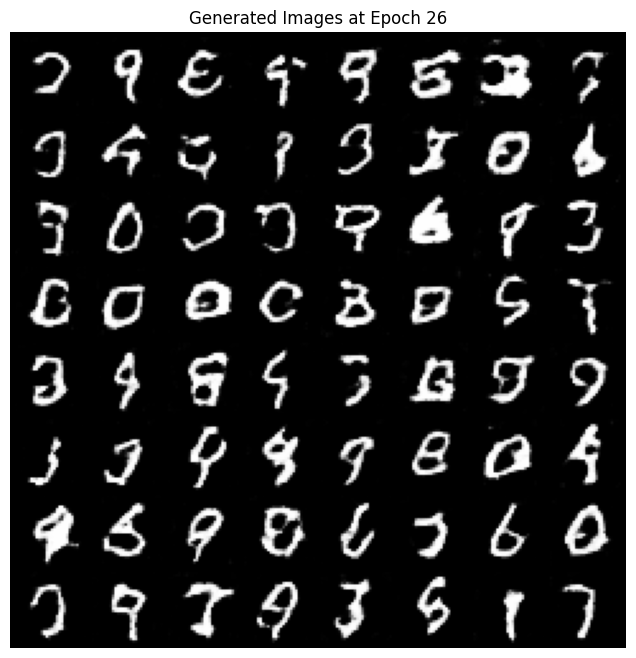

Epoch [27/50], Step [469/469], D Loss: -0.7899, G Loss: -0.0601


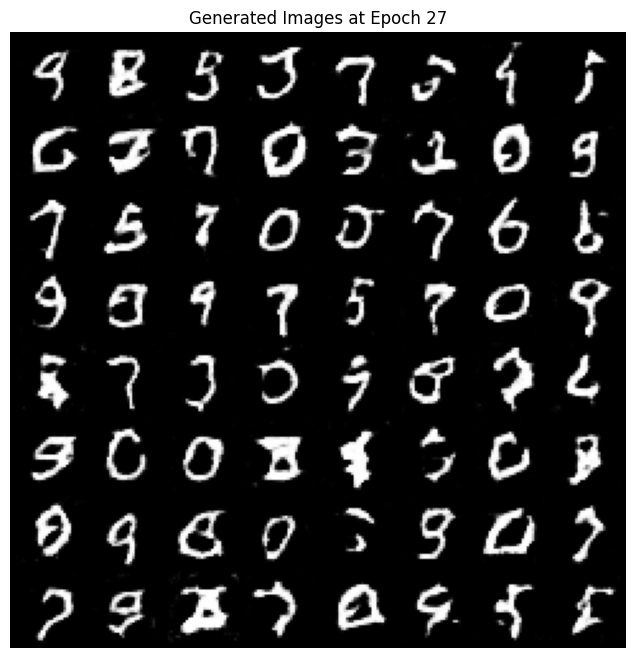

Epoch [28/50], Step [469/469], D Loss: -0.7086, G Loss: -0.5105


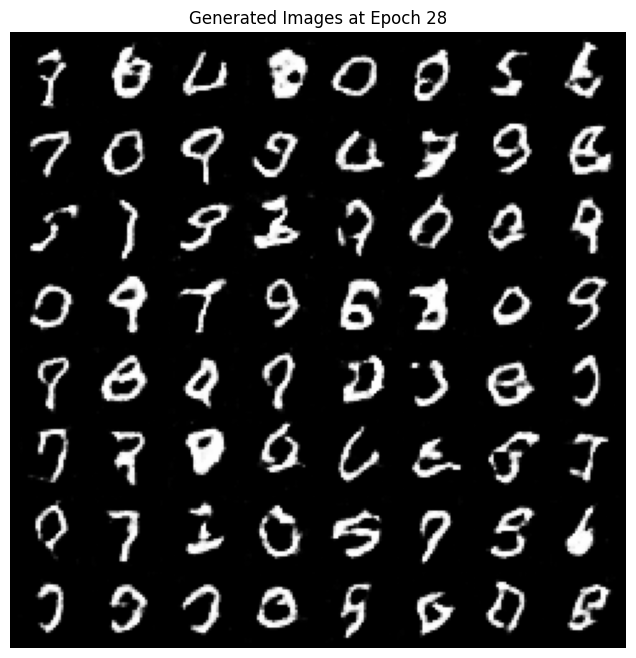

Epoch [29/50], Step [469/469], D Loss: -0.7381, G Loss: -0.0691


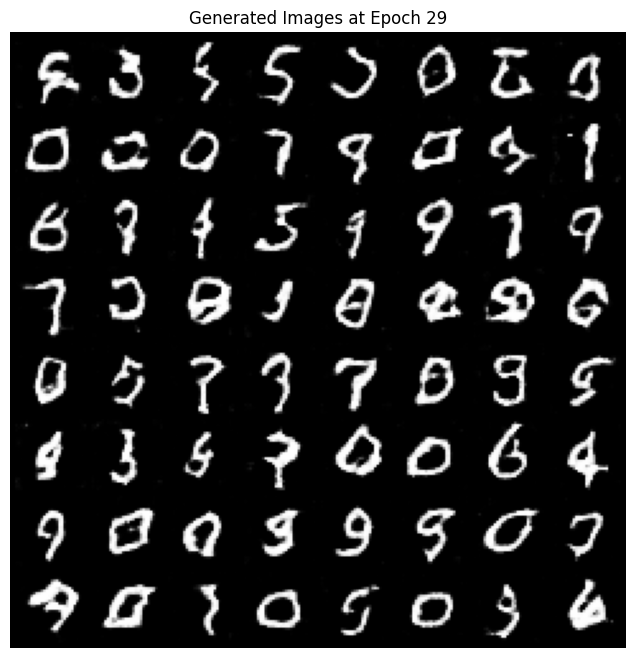

Epoch [30/50], Step [469/469], D Loss: -0.7821, G Loss: -0.0590


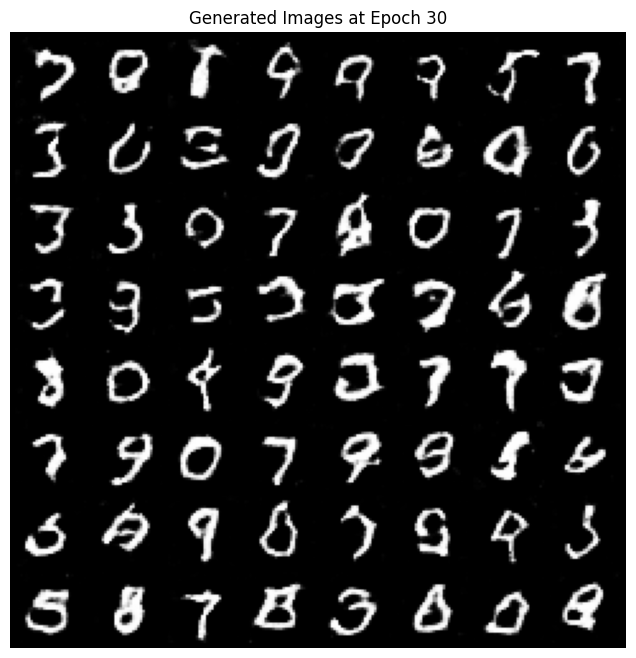

Epoch [31/50], Step [469/469], D Loss: -0.7696, G Loss: -0.0735


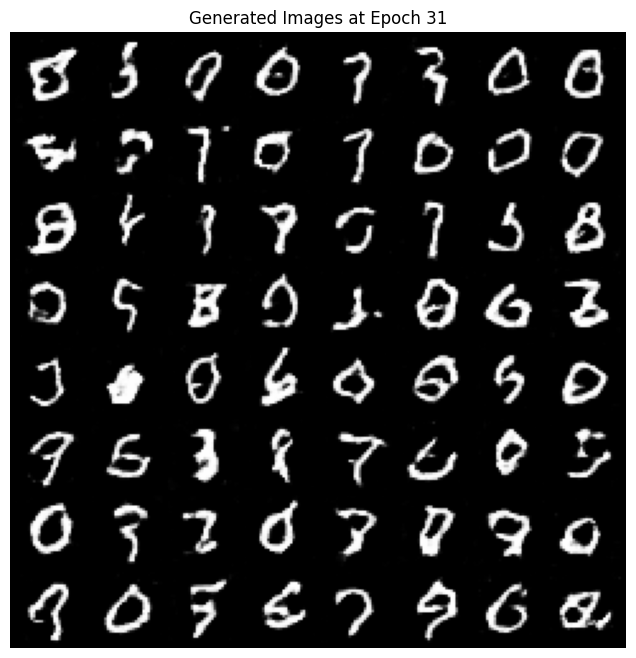

Epoch [32/50], Step [469/469], D Loss: -0.8087, G Loss: -0.1042


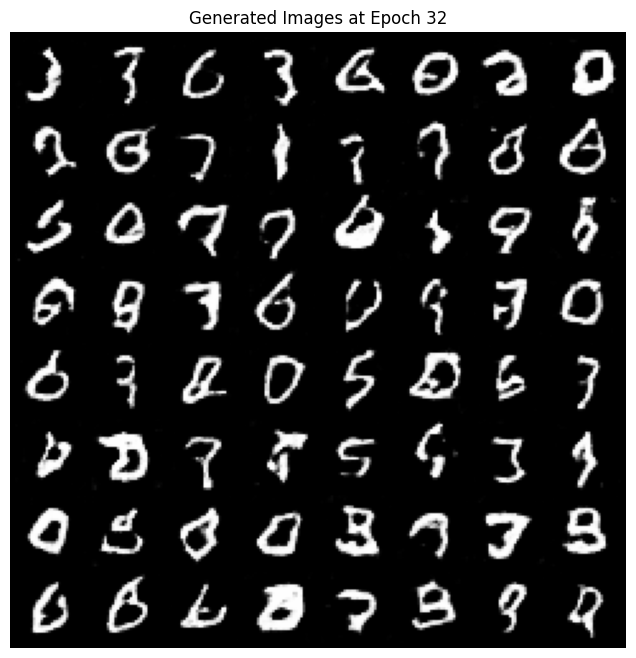

Epoch [33/50], Step [469/469], D Loss: -0.7961, G Loss: -0.0879


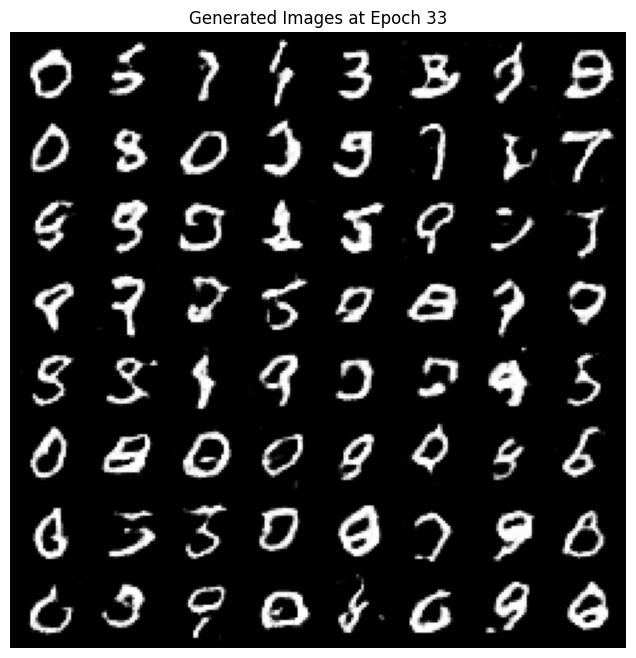

Epoch [34/50], Step [469/469], D Loss: -0.7417, G Loss: -0.0541


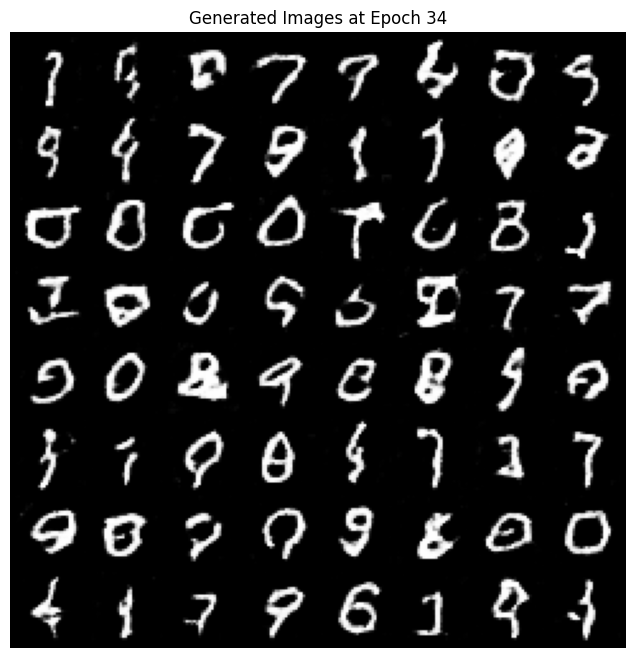

Epoch [35/50], Step [469/469], D Loss: -0.6984, G Loss: -0.1296


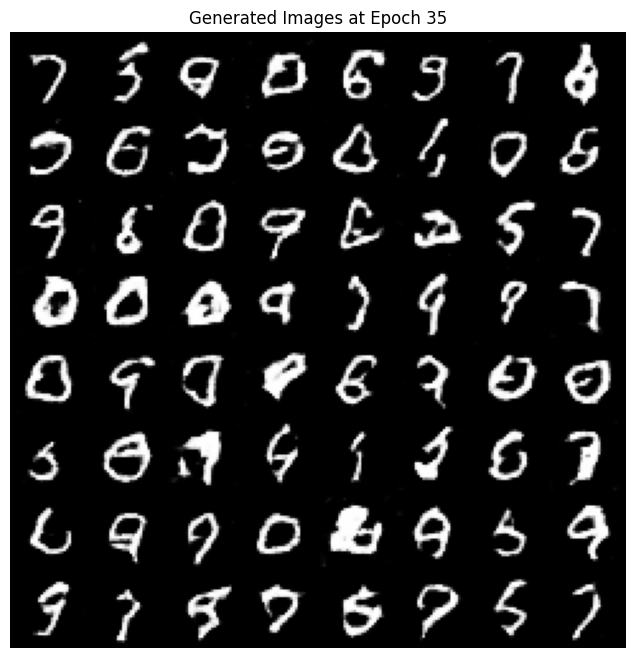

Epoch [36/50], Step [469/469], D Loss: -0.7808, G Loss: -0.0630


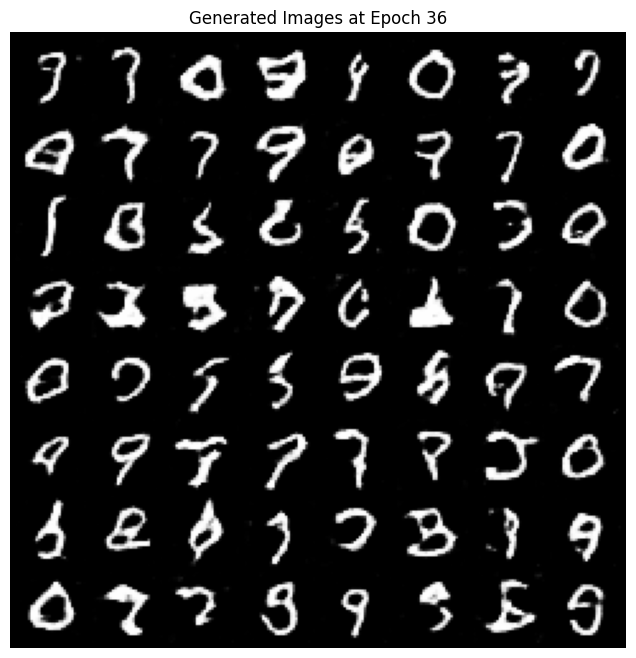

Epoch [37/50], Step [469/469], D Loss: -0.6827, G Loss: -0.0485


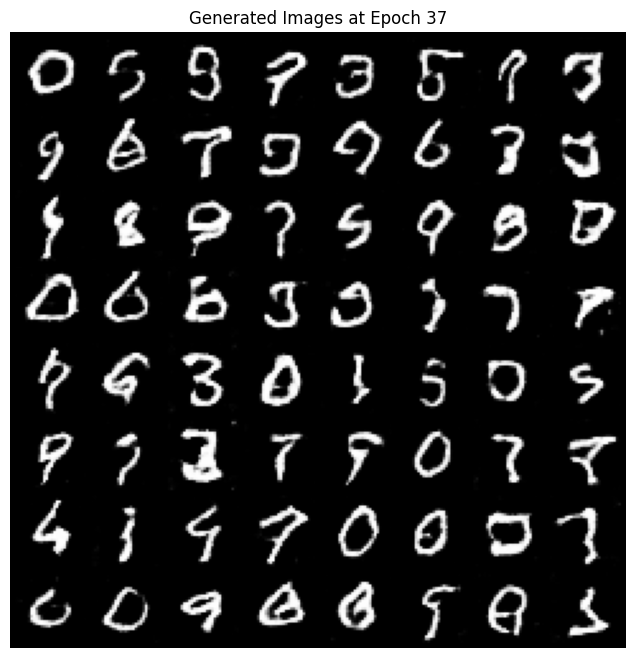

Epoch [38/50], Step [469/469], D Loss: -0.8232, G Loss: -0.1191


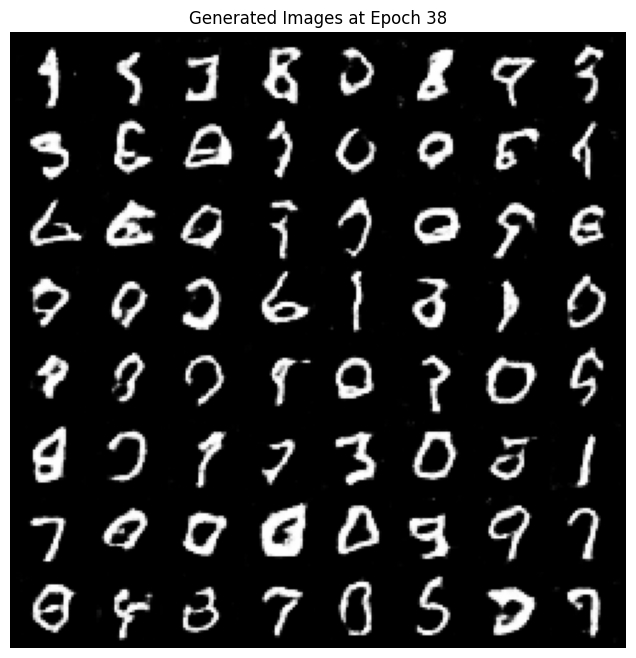

In [ ]:
for epoch in range(epochs):
    for i, (real_images, _) in enumerate(train_loader):
        # 1. Real Images 처리
        real_images = real_images.to(device)  # [batch_size, 1, 28, 28]
        batch_size = real_images.size(0)

        # 2. Fake Images 생성
        z = torch.randn(batch_size, z_dim, 1, 1).to(device)  # [batch_size, z_dim, 1, 1]
        fake_images = G(z)

        # 3. Discriminator 학습
        optimizer_D.zero_grad()

        # 진짜 이미지에 대한 Discriminator 손실
        real_loss = -torch.mean(D(real_images))
        # 가짜 이미지에 대한 Discriminator 손실
        fake_loss = torch.mean(D(fake_images.detach()))
        # Gradient Penalty 계산
        gp = gradient_penalty(D, real_images, fake_images, device)

        d_loss = real_loss + fake_loss + lambda_gp * gp
        d_loss.backward()  # 그래프 해제
        optimizer_D.step()

        # 4. Generator 학습
        if i % 5 == 0:  # Generator는 매 5번째 배치마다 업데이트
            optimizer_G.zero_grad()
            fake_images = G(z)  # 새로운 Fake Images 생성
            g_loss = -torch.mean(D(fake_images))  # Generator 손실 계산
            g_loss.backward()  # 그래프 해제
            optimizer_G.step()

    # 5. 매 Epoch마다 결과 출력 및 샘플 생성
    print(f"Epoch [{epoch+1}/{epochs}], Step [{i+1}/{len(train_loader)}], D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")
    with torch.no_grad():
        z = torch.randn(64, z_dim, 1, 1).to(device)
        sample_images = G(z).cpu()
        sample_images = sample_images * 0.5 + 0.5  # [-1, 1] -> [0, 1]

        # 샘플 이미지 시각화
        grid = torchvision.utils.make_grid(sample_images, nrow=8, padding=2)
        plt.figure(figsize=(8, 8))
        plt.axis("off")
        plt.title(f"Generated Images at Epoch {epoch + 1}")
        plt.imshow(grid.permute(1, 2, 0), cmap="gray")  # Grayscale 이미지 출력
        plt.show()